In [72]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import randint
from imblearn.over_sampling import SMOTE
pd.set_option('display.max_columns', None)
plt.style.use('seaborn')
import xgboost as xgb
import seaborn as sns

In [2]:
df = pd.read_csv('fightdata.csv')

In [3]:
df.head(10)

BPrev  BStreak  B_Age  B_Height                        B_HomeTown  B_ID  \
0      0        0   38.0     193.0                  Hounslow England   808   
1      0        0   36.0     172.0   Chicago, Illinois United States  1054   
2      0        0   39.0     167.0       Isla Vista , California USA   959   
3      0        0   33.0     167.0                 San Diego, CA USA  1056   
4      0        0   36.0     185.0               Southampton England  2005   
5      0        0   35.0     180.0                   Amazonas Brazil  2101   
6      0        0   26.0     175.0   Detroit, Michigan United States  2157   
7      0        0   33.0     175.0                   Dagestan Russia  2158   
8      0        0   36.0     180.0  Zinzeli, Astrakhan Oblast Russia  2160   
9      0        0   33.0     162.0          Dagestan Republic Russia  2084   

                             B_Location            B_Name  B_Weight  \
0             Amsterdam The Netherlands  Alistair Overeem     120.0   
1       Chicago, Illinois United States     Ricardo Lamas      65.0   
2            Sacramento, California USA      Urijah Faber      61.0   
3                     San Diego, CA USA    Danny Martinez      56.0   
4                   Southampton England        Tom Watson      84.0   
5                 Rio de Janeiro Brazil      Alan Patrick      70.0   
6       Las Vegas, Nevada United States         Kevin Lee      70.0   
7  Coconut Creek, Florida United States  Rashid Magomedov      70.0   
8      Zinzeli, Astrakhan Oblast Russia    Gasan Umalatov      77.0   
9              Dagestan Republic Russia    Ali Bagautinov      56.0   

   B__Round1_Grappling_Reversals_Landed  B__Round1_Grappling_Standups_Landed  \
0                                   NaN                                  NaN   
1                                   NaN                                  NaN   
2                                   NaN                                  NaN   
3                                   NaN                                  NaN   
4                                   NaN                                  NaN   
5                                   NaN                                  NaN   
6                                   NaN                                  NaN   
7                                   NaN                                  NaN   
8                                   NaN                                  NaN   
9                                   NaN                                  NaN   

   B__Round1_Grappling_Submissions_Attempts  \
0                                       NaN   
1                                       NaN   
2                                       NaN   
3                                       NaN   
4                                       NaN   
5                                       NaN   
6                                       NaN   
7                                       NaN   
8                                       NaN   
9                                       NaN   

   B__Round1_Grappling_Takedowns_Attempts  \
0                                     NaN   
1                                     NaN   
2                                     NaN   
3                                     NaN   
4                                     NaN   
5                                     NaN   
6                                     NaN   
7                                     NaN   
8                                     NaN   
9                                     NaN   

   B__Round1_Grappling_Takedowns_Landed  \
0                                   NaN   
1                                   NaN   
2                                   NaN   
3                                   NaN   
4                                   NaN   
5                                   NaN   
6                                   NaN   
7                                   NaN   
8                                   NaN   
9                                   N

In [4]:
df.describe()

BPrev      BStreak        B_Age     B_Height         B_ID  \
count  2318.000000  2318.000000  2301.000000  2301.000000  2318.000000   
mean      2.391286     0.744607    31.776184   177.327249  2120.001726   
std       2.539978     1.145596     4.165267     8.807620   705.089725   
min       0.000000     0.000000    20.000000   152.000000   129.000000   
25%       0.000000     0.000000    29.000000   172.000000  1910.250000   
50%       2.000000     0.000000    31.000000   177.000000  2230.000000   
75%       4.000000     1.000000    35.000000   182.000000  2709.000000   
max      14.000000    10.000000    48.000000   213.000000  3196.000000   

          B_Weight  B__Round1_Grappling_Reversals_Landed  \
count  2306.000000                           1647.000000   
mean     73.699480                              0.074681   
std      15.425347                              0.305691   
min      52.000000                              0.000000   
25%      61.000000                              0.000000   
50%      70.000000                              0.000000   
75%      84.000000                              0.000000   
max     120.000000                              3.000000   

       B__Round1_Grappling_Standups_Landed  \
count                          1647.000000   
mean                              1.103825   
std                               1.537946   
min                               0.000000   
25%                               0.000000   
50%                               1.000000   
75%                               2.000000   
max                              13.000000   

       B__Round1_Grappling_Submissions_Attempts  \
count                               1647.000000   
mean                                   0.577413   
std                                    1.049758   
min                                    0.000000   
25%                                    0.000000   
50%                                    0.000000   
75%                                    1.000000   
max                                    8.000000   

       B__Round1_Grappling_Takedowns_Attempts  \
count                             1647.000000   
mean                                 3.852459   
std                                  5.261864   
min                                  0.000000   
25%                                  0.000000   
50%                                  2.000000   
75%                                  5.000000   
max                                 47.000000   

       B__Round1_Grappling_Takedowns_Landed  \
count                           1647.000000   
mean                               1.657559   
std                                2.443886   
min                                0.000000   
25%                                0.000000   
50%                                1.000000   
75%                                2.000000   
max                               20.000000   

       B__Round1_Strikes_Body Significant Strikes_Attempts  \
count                                        1647.000000     
mean                                           15.221615     
std                                            16.047585     
min                                             0.000000     
25%                                             4.000000     
50%                                            10.000000     
75%                                            21.000000     
max                                           124.000000     

       B__Round1_Strikes_Body Significant Strikes_Landed  \
count                                        1647.000000   
mean                                           10.128719   
std                                            10.967552   
min                                             0.000000   
25%                                             3.000000   
50%                                             7.000000   
75%                                            14.000000   
max                      

In [5]:
#dropping these unnecessary columns
df.drop(columns=['B_HomeTown', 'R_HomeTown', 'B_Location', 'R_Location'], inplace=True)
#nan values are 0 because they are for the fighters who have no previous fights or haven't previously done what that column is counting
df.fillna(value=0, inplace=True)

In [6]:
df.rename(columns={ 'BPrev':'B__Prev', 'RPrev':'R__Prev', 'B_Age':'B__Age', 'B_Height':'B__Height', 'B_Weight':'B__Weight', 'R_Age':'R__Age', 'R_Height':'R__Height', 'R_Weight':'R__Weight'} ,inplace=True)

In [7]:
#dropping fights that were draws or no contests
# df.drop(rows=df[(df.winner=='no contest')|(df.winner=='draw')], inplace=True)
df = df[~df['winner'].isin(['no contest', 'draw'])]

In [8]:
#number of fights with at least one of the fighters having no previous fights in the UFC
#might get rid of any fight without both fighters having at least 2 fights
len(df[(df['B__Prev']<=1)|(df['R__Prev']<=1)])
#gunna have to drop these rows

1277

In [9]:
len(df)

2278

In [10]:
#dropping those rows
df = df[df.B__Prev!=0]
df = df[df.R__Prev!=0]
df = df[df.B__Prev!=1]
df = df[df.R__Prev!=1]
df

B__Prev  BStreak  B__Age  B__Height  B_ID                 B_Name  \
338         2        1    33.0      172.0   532       Rafael dos Anjos   
352         2        0    38.0      170.0  1367           Rodrigo Damm   
353         2        0    26.0      170.0  2126        Justin Scoggins   
373         2        2    32.0      170.0  2164          Russell Doane   
381         2        1    34.0      177.0   669             Rick Story   
387         2        1    33.0      162.0  2095            Wilson Reis   
389         3        1    29.0      177.0  2168         Beneil Dariush   
408         2        2    31.0      167.0  1907        Dennis Bermudez   
424         2        1    31.0      177.0  2232             Matt Hobar   
434         2        2    29.0      177.0  1974             Myles Jury   
446         2        0    33.0      167.0  2010            Chico Camus   
458         2        1    39.0      185.0   368        Michael Bisping   
459         2        2    31.0      187.0  2061           Clint Hester   
466         2        0    33.0      162.0  1913         Marcus Brimage   
468         3        1    31.0      175.0  1983            Al Iaquinta   
480         2        2    35.0      187.0   507            CB Dollaway   
482         2        2    33.0      175.0  2158       Rashid Magomedov   
484         2        2    33.0      165.0  1935           Mitch Gagnon   
485         2        0    28.0      185.0  2173            Mike Rhodes   
491         2        1    31.0      177.0  1481         Yancy Medeiros   
492         2        2    28.0      177.0  1531       Charles Oliveira   
503         3        0    34.0      175.0  1066       Benson Henderson   
505         2        2    35.0      177.0   514          Gleison Tibau   
506         3        0    32.0      180.0  1783          Lorenz Larkin   
514         2        0    27.0      190.0  2167               Andy Enz   
517         2        1    38.0      167.0  2022            Sara McMann   
518         3        3    26.0      175.0  2070        Kelvin Gastelum   
519         2        1    36.0      185.0  2005             Tom Watson   
520         2        1    37.0      182.0   435            Tim Boetsch   
526         2        0    29.0      182.0  2228          Richard Walsh   
...       ...      ...     ...        ...   ...                    ...   
2275        2        1    28.0      185.0  3023           Markus Perez   
2277        6        1    34.0      180.0  2019               Jon Tuck   
2278        4        1    32.0      167.0  1737           Luke Sanders   
2279        7        1    33.0      160.0  2352            Angela Hill   
2280        3        3    30.0      165.0  2878    Deiveson Figueiredo   
2281        9        2    28.0      180.0  2119             Andre Fili   
2283        2        0    32.0      170.0  3012         Kalindra Faria   
2284        6        0    37.0      182.0  2174        George Sullivan   
2285        8        2    27.0      180.0  2247          Warlley Alves   
2293        7        2    32.0      160.0  2678  Karolina Kowalkiewicz   
2294        4        0    28.0      177.0  2944          Brandon Davis   
2295        3        3    28.0      167.0  2930           Cody Stamann   
2296        3        3    27.0      165.0  2791         Tatiana Suarez   
2297        8        1    34.0      160.0  1904            John Dodson   
2298        3        0    25.0      160.0  2864          Jarred Brooks   
2299        5        1    27.0      182.0  2828         Darren Stewart   
2300        3        0    29.0      175.0  2905          Frank Camacho   
2301        6        4    25.0      182.0  2544            Darren Till   
2302        7        0    29.0      182.0  2216             Alex White   
2303        6        2    29.0      182.0  2851             Niko Price   
2305        3        2    24.0      172.0  2879         Lucie Pudilova   
2306        8        2    30.0      175.0  2057         Conor McGregor   
2307      

In [11]:
len(df)

1001

In [12]:
fights = df[['B_Name', 'B_ID', 'R_Name', 'R_ID', 'winby', 'winner', 'Date', 'Event_ID', 'Fight_ID', 'Max_round', 'Last_round']]
fights

,B_Name,B_ID,R_Name,R_ID,winby,winner,Date,Event_ID,Fight_ID,Max_round,Last_round
338,Rafael dos Anjos,532,Benson Henderson,1066,KO/TKO,blue,08/25/2014,682,4903,5,1
352,Rodrigo Damm,1367,Al Iaquinta,1983,KO/TKO,red,09/16/2014,683,4945,3,3
353,Justin Scoggins,2126,John Moraga,2007,SUB,red,09/08/2014,683,4986,3,2
373,Russell Doane,2164,Iuri Alcantara,1706,DEC,red,09/15/2014,685,4981,3,3
381,Rick Story,669,Gunnar Nelson,2015,DEC,blue,07/18/2015,686,4990,5,5
387,Wilson Reis,2095,Scott Jorgensen,1034,SUB,blue,10/27/2014,687,5023,3,1
389,Beneil Dariush,2168,Diego Ferreira,2208,DEC,blue,10/27/2014,687,5027,3,3
408,Dennis Bermudez,1907,Ricardo Lamas,1054,SUB,red,11/17/2014,689,5012,3,1
424,Matt Hobar,2232,Sergio Pettis,2118,DEC,red,12/08/2014,690,5095,3,3
434,Myles Jury,1974,Donald Cerrone,1076,DEC,red,01/05/2015,691,5114,3,3


In [13]:
df.drop(columns=['BStreak', 'B_Name', 'B_ID', 'R_Name', 'R_ID', 'winby', 'winner', 'Date', 'Event_ID', 'Fight_ID', 'Max_round'], inplace=True)
df

B__Prev  B__Age  B__Height  B__Weight  \
338         2    33.0      172.0       77.0   
352         2    38.0      170.0       70.0   
353         2    26.0      170.0       61.0   
373         2    32.0      170.0       61.0   
381         2    34.0      177.0       77.0   
387         2    33.0      162.0       56.0   
389         3    29.0      177.0       70.0   
408         2    31.0      167.0       65.0   
424         2    31.0      177.0       61.0   
434         2    29.0      177.0       65.0   
446         2    33.0      167.0       56.0   
458         2    39.0      185.0       84.0   
459         2    31.0      187.0       93.0   
466         2    33.0      162.0       61.0   
468         3    31.0      175.0       70.0   
480         2    35.0      187.0       84.0   
482         2    33.0      175.0       70.0   
484         2    33.0      165.0       61.0   
485         2    28.0      185.0       77.0   
491         2    31.0      177.0       77.0   
492         2    28.0      177.0       70.0   
503         3    34.0      175.0       77.0   
505         2    35.0      177.0       70.0   
506         3    32.0      180.0       77.0   
514         2    27.0      190.0       84.0   
517         2    38.0      167.0       61.0   
518         3    26.0      175.0       84.0   
519         2    36.0      185.0       84.0   
520         2    37.0      182.0       84.0   
526         2    29.0      182.0       77.0   
...       ...     ...        ...        ...   
2275        2    28.0      185.0       84.0   
2277        6    34.0      180.0       70.0   
2278        4    32.0      167.0       61.0   
2279        7    33.0      160.0       52.0   
2280        3    30.0      165.0       56.0   
2281        9    28.0      180.0       65.0   
2283        2    32.0      170.0       56.0   
2284        6    37.0      182.0       77.0   
2285        8    27.0      180.0       77.0   
2293        7    32.0      160.0       52.0   
2294        4    28.0      177.0       65.0   
2295        3    28.0      167.0       61.0   
2296        3    27.0      165.0       52.0   
2297        8    34.0      160.0       61.0   
2298        3    25.0      160.0       56.0   
2299        5    27.0      182.0       84.0   
2300        3    29.0      175.0       77.0   
2301        6    25.0      182.0       77.0   
2302        7    29.0      182.0       70.0   
2303        6    29.0      182.0       77.0   
2305        3    24.0      172.0       61.0   
2306        8    30.0      175.0       70.0   
2307        9    28.0      182.0       70.0   
2309        8    33.0      165.0       56.0   
2310        3    28.0      193.0       93.0   
2311        7    34.0      162.0       52.0   
2312        4    30.0      167.0       65.0   
2313        7    34.0      172.0       70.0   
2314        9    31.0      177.0       70.0   
2315        5    35.0      180.0       70.0   

      B__Round1_Grappling_Reversals_Landed  \
338                                    0.0   
352                                    0.0   
353                                    0.0   
373                                    0.0   
381                                    0.0   
387                                    0.0   
389                                    0.0   
408                                    0.0   
424                                    0.0   
434                                    0.0   
446                                    0.0   
458                                    0.0   
459                                    0.0   
466                                    0.0   
468                                    0.0   
480                                    0.0   
482                                    0.0   
484                                    0.0   
485                                    0.0   
491                                    0.0   
492                                    0.0   
503                                    0.0   
505                              

In [14]:
#separate into a blue_df and a red_df - for round1 data
df_blue = df.iloc[:, 0:91]
df_red = df.iloc[:, 440:531]

In [15]:
#getting average fight performance
df_blue.iloc[:, 4:]=df_blue.iloc[:, 4:].div(df_blue.B__Prev, axis=0)
df_red.iloc[:, 4:]=df_red.iloc[:, 4:].div(df_red.R__Prev, axis=0)

In [16]:
df_blue

,B__Prev,B__Age,B__Height,B__Weight,B__Round1_Grappling_Reversals_Landed,B__Round1_Grappling_Standups_Landed,B__Round1_Grappling_Submissions_Attempts,B__Round1_Grappling_Takedowns_Attempts,B__Round1_Grappling_Takedowns_Landed,B__Round1_Strikes_Body Significant Strikes_Attempts,B__Round1_Strikes_Body Significant Strikes_Landed,B__Round1_Strikes_Body Total Strikes_Attempts,B__Round1_Strikes_Body Total Strikes_Landed,B__Round1_Strikes_Clinch Body Strikes_Attempts,B__Round1_Strikes_Clinch Body Strikes_Landed,B__Round1_Strikes_Clinch Head Strikes_Attempts,B__Round1_Strikes_Clinch Head Strikes_Landed,B__Round1_Strikes_Clinch Leg Strikes_Attempts,B__Round1_Strikes_Clinch Leg Strikes_Landed,B__Round1_Strikes_Clinch Significant Kicks_Attempts,B__Round1_Strikes_Clinch Significant Kicks_Landed,B__Round1_Strikes_Clinch Significant Punches_Attempts,B__Round1_Strikes_Clinch Significant Punches_Landed,B__Round1_Strikes_Clinch Significant Strikes_Attempts,B__Round1_Strikes_Clinch Significant Strikes_Landed,B__Round1_Strikes_Clinch Total Strikes_Attempts,B__Round1_Strikes_Clinch Total Strikes_Landed,B__Round1_Strikes_Distance Body Kicks_Attempts,B__Round1_Strikes_Distance Body Kicks_Landed,B__Round1_Strikes_Distance Body Punches_Attempts,B__Round1_Strikes_Distance Body Punches_Landed,B__Round1_Strikes_Distance Body Strikes_Attempts,B__Round1_Strikes_Distance Body Strikes_Landed,B__Round1_Strikes_Distance Head Kicks_Attempts,B__Round1_Strikes_Distance Head Kicks_Landed,B__Round1_Strikes_Distance Head Punches_Attempts,B__Round1_Strikes_Distance Head Punches_Landed,B__Round1_Strikes_Distance Head Strikes_Attempts,B__Round1_Strikes_Distance Head Strikes_Landed,B__Round1_Strikes_Distance Leg Kicks_Attempts,B__Round1_Strikes_Distance Leg Kicks_Landed,B__Round1_Strikes_Distance Leg Strikes_Attempts,B__Round1_Strikes_Distance Leg Strikes_Landed,B__Round1_Strikes_Distance Strikes_Attempts,B__Round1_Strikes_Distance Strikes_Landed,B__Round1_Strikes_Ground Body Strikes_Attempts,B__Round1_Strikes_Ground Body Strikes_Landed,B__Round1_Strikes_Ground Head Strikes_Attempts,B__Round1_Strikes_Ground Head Strikes_Landed,B__Round1_Strikes_Ground Leg Strikes_Attempts,B__Round1_Strikes_Ground Leg Strikes_Landed,B__Round1_Strikes_Ground Significant Kicks_Attempts,B__Round1_Strikes_Ground Significant Kicks_Landed,B__Round1_Strikes_Ground Significant Punches_Attempts,B__Round1_Strikes_Ground Significant Punches_Landed,B__Round1_Strikes_Ground Significant Strikes_Attempts,B__Round1_Strikes_Ground Significant Strikes_Landed,B__Round1_Strikes_Ground Total Strikes_Attempts,B__Round1_Strikes_Ground Total Strikes_Landed,B__Round1_Strikes_Head Significant Strikes_Attempts,B__Round1_Strikes_Head Significant Strikes_Landed,B__Round1_Strikes_Head Total Strikes_Attempts,B__Round1_Strikes_Head Total Strikes_Landed,B__Round1_Strikes_Kicks_Attempts,B__Round1_Strikes_Kicks_Landed,B__Round1_Strikes_Knock Down_Landed,B__Round1_Strikes_Leg Total Strikes_Attempts,B__Round1_Strikes_Leg Total Strikes_Landed,B__Round1_Strikes_Legs Significant Strikes_Attempts,B__Round1_Strikes_Legs Significant Strikes_Landed,B__Round1_Strikes_Legs Total Strikes_Attempts,B__Round1_Strikes_Legs Total Strikes_Landed,B__Round1_Strikes_Punches_Attempts,B__Round1_Strikes_Punches_Landed,B__Round1_Strikes_Significant Strikes_Attempts,B__Round1_Strikes_Significant Strikes_Landed,B__Round1_Strikes_Total Strikes_Attempts,B__Round1_Strikes_Total Strikes_Landed,B__Round1_TIP_Back Control Time,B__Round1_TIP_Clinch Time,B__Round1_TIP_Control Time,B__Round1_TIP_Distance Time,B__Round1_TIP_Ground Control Time,B__Round1_TIP_Ground Time,B__Round1_TIP_Guard Control Time,B__Round1_TIP_Half Guard Control Time,B__Round1_TIP_Misc. Ground Control Time,B__Round1_TIP_Mount Control Time,B__Round1_TIP_Neutral Time,B__Round1_TIP_Side Control Time,B__Round1_TIP_Standing Time
338,2,33.0,172.0,77.0,0.000000,2.000000,1.000000,0.500000,0.500000,8.500000,5.000000,11.000000,7.500000,1.000000,1.000000,0.500000,0.000000,0.500000,0.000000,0.5000

In [17]:
df_red

,R__Prev,R__Age,R__Height,R__Weight,R__Round1_Grappling_Reversals_Landed,R__Round1_Grappling_Standups_Landed,R__Round1_Grappling_Submissions_Attempts,R__Round1_Grappling_Takedowns_Attempts,R__Round1_Grappling_Takedowns_Landed,R__Round1_Strikes_Body Significant Strikes_Attempts,R__Round1_Strikes_Body Significant Strikes_Landed,R__Round1_Strikes_Body Total Strikes_Attempts,R__Round1_Strikes_Body Total Strikes_Landed,R__Round1_Strikes_Clinch Body Strikes_Attempts,R__Round1_Strikes_Clinch Body Strikes_Landed,R__Round1_Strikes_Clinch Head Strikes_Attempts,R__Round1_Strikes_Clinch Head Strikes_Landed,R__Round1_Strikes_Clinch Leg Strikes_Attempts,R__Round1_Strikes_Clinch Leg Strikes_Landed,R__Round1_Strikes_Clinch Significant Kicks_Attempts,R__Round1_Strikes_Clinch Significant Kicks_Landed,R__Round1_Strikes_Clinch Significant Punches_Attempts,R__Round1_Strikes_Clinch Significant Punches_Landed,R__Round1_Strikes_Clinch Significant Strikes_Attempts,R__Round1_Strikes_Clinch Significant Strikes_Landed,R__Round1_Strikes_Clinch Total Strikes_Attempts,R__Round1_Strikes_Clinch Total Strikes_Landed,R__Round1_Strikes_Distance Body Kicks_Attempts,R__Round1_Strikes_Distance Body Kicks_Landed,R__Round1_Strikes_Distance Body Punches_Attempts,R__Round1_Strikes_Distance Body Punches_Landed,R__Round1_Strikes_Distance Body Strikes_Attempts,R__Round1_Strikes_Distance Body Strikes_Landed,R__Round1_Strikes_Distance Head Kicks_Attempts,R__Round1_Strikes_Distance Head Kicks_Landed,R__Round1_Strikes_Distance Head Punches_Attempts,R__Round1_Strikes_Distance Head Punches_Landed,R__Round1_Strikes_Distance Head Strikes_Attempts,R__Round1_Strikes_Distance Head Strikes_Landed,R__Round1_Strikes_Distance Leg Kicks_Attempts,R__Round1_Strikes_Distance Leg Kicks_Landed,R__Round1_Strikes_Distance Leg Strikes_Attempts,R__Round1_Strikes_Distance Leg Strikes_Landed,R__Round1_Strikes_Distance Strikes_Attempts,R__Round1_Strikes_Distance Strikes_Landed,R__Round1_Strikes_Ground Body Strikes_Attempts,R__Round1_Strikes_Ground Body Strikes_Landed,R__Round1_Strikes_Ground Head Strikes_Attempts,R__Round1_Strikes_Ground Head Strikes_Landed,R__Round1_Strikes_Ground Leg Strikes_Attempts,R__Round1_Strikes_Ground Leg Strikes_Landed,R__Round1_Strikes_Ground Significant Kicks_Attempts,R__Round1_Strikes_Ground Significant Kicks_Landed,R__Round1_Strikes_Ground Significant Punches_Attempts,R__Round1_Strikes_Ground Significant Punches_Landed,R__Round1_Strikes_Ground Significant Strikes_Attempts,R__Round1_Strikes_Ground Significant Strikes_Landed,R__Round1_Strikes_Ground Total Strikes_Attempts,R__Round1_Strikes_Ground Total Strikes_Landed,R__Round1_Strikes_Head Significant Strikes_Attempts,R__Round1_Strikes_Head Significant Strikes_Landed,R__Round1_Strikes_Head Total Strikes_Attempts,R__Round1_Strikes_Head Total Strikes_Landed,R__Round1_Strikes_Kicks_Attempts,R__Round1_Strikes_Kicks_Landed,R__Round1_Strikes_Knock Down_Landed,R__Round1_Strikes_Leg Total Strikes_Attempts,R__Round1_Strikes_Leg Total Strikes_Landed,R__Round1_Strikes_Legs Significant Strikes_Attempts,R__Round1_Strikes_Legs Significant Strikes_Landed,R__Round1_Strikes_Legs Total Strikes_Attempts,R__Round1_Strikes_Legs Total Strikes_Landed,R__Round1_Strikes_Punches_Attempts,R__Round1_Strikes_Punches_Landed,R__Round1_Strikes_Significant Strikes_Attempts,R__Round1_Strikes_Significant Strikes_Landed,R__Round1_Strikes_Total Strikes_Attempts,R__Round1_Strikes_Total Strikes_Landed,R__Round1_TIP_Back Control Time,R__Round1_TIP_Clinch Time,R__Round1_TIP_Control Time,R__Round1_TIP_Distance Time,R__Round1_TIP_Ground Control Time,R__Round1_TIP_Ground Time,R__Round1_TIP_Guard Control Time,R__Round1_TIP_Half Guard Control Time,R__Round1_TIP_Misc. Ground Control Time,R__Round1_TIP_Mount Control Time,R__Round1_TIP_Neutral Time,R__Round1_TIP_Side Control Time,R__Round1_TIP_Standing Time
338,2,34.0,175.0,77.0,0.000000,1.000000,0.500000,0.500000,0.500000,2.500000,2.000000,4.000000,3.500000,0.500000,0.500000,1.500000,0.000000,0.000000,0.000000,0.50000

In [18]:
df_blue.columns = [c.replace('B__', '') for c in df_blue]
df_red.columns = [c.replace('R__', '') for c in df_red]

In [19]:
#Blue fighter - Red fighter
diff = df_blue.sub(df_red, axis='columns')
diff

,Prev,Age,Height,Weight,Round1_Grappling_Reversals_Landed,Round1_Grappling_Standups_Landed,Round1_Grappling_Submissions_Attempts,Round1_Grappling_Takedowns_Attempts,Round1_Grappling_Takedowns_Landed,Round1_Strikes_Body Significant Strikes_Attempts,Round1_Strikes_Body Significant Strikes_Landed,Round1_Strikes_Body Total Strikes_Attempts,Round1_Strikes_Body Total Strikes_Landed,Round1_Strikes_Clinch Body Strikes_Attempts,Round1_Strikes_Clinch Body Strikes_Landed,Round1_Strikes_Clinch Head Strikes_Attempts,Round1_Strikes_Clinch Head Strikes_Landed,Round1_Strikes_Clinch Leg Strikes_Attempts,Round1_Strikes_Clinch Leg Strikes_Landed,Round1_Strikes_Clinch Significant Kicks_Attempts,Round1_Strikes_Clinch Significant Kicks_Landed,Round1_Strikes_Clinch Significant Punches_Attempts,Round1_Strikes_Clinch Significant Punches_Landed,Round1_Strikes_Clinch Significant Strikes_Attempts,Round1_Strikes_Clinch Significant Strikes_Landed,Round1_Strikes_Clinch Total Strikes_Attempts,Round1_Strikes_Clinch Total Strikes_Landed,Round1_Strikes_Distance Body Kicks_Attempts,Round1_Strikes_Distance Body Kicks_Landed,Round1_Strikes_Distance Body Punches_Attempts,Round1_Strikes_Distance Body Punches_Landed,Round1_Strikes_Distance Body Strikes_Attempts,Round1_Strikes_Distance Body Strikes_Landed,Round1_Strikes_Distance Head Kicks_Attempts,Round1_Strikes_Distance Head Kicks_Landed,Round1_Strikes_Distance Head Punches_Attempts,Round1_Strikes_Distance Head Punches_Landed,Round1_Strikes_Distance Head Strikes_Attempts,Round1_Strikes_Distance Head Strikes_Landed,Round1_Strikes_Distance Leg Kicks_Attempts,Round1_Strikes_Distance Leg Kicks_Landed,Round1_Strikes_Distance Leg Strikes_Attempts,Round1_Strikes_Distance Leg Strikes_Landed,Round1_Strikes_Distance Strikes_Attempts,Round1_Strikes_Distance Strikes_Landed,Round1_Strikes_Ground Body Strikes_Attempts,Round1_Strikes_Ground Body Strikes_Landed,Round1_Strikes_Ground Head Strikes_Attempts,Round1_Strikes_Ground Head Strikes_Landed,Round1_Strikes_Ground Leg Strikes_Attempts,Round1_Strikes_Ground Leg Strikes_Landed,Round1_Strikes_Ground Significant Kicks_Attempts,Round1_Strikes_Ground Significant Kicks_Landed,Round1_Strikes_Ground Significant Punches_Attempts,Round1_Strikes_Ground Significant Punches_Landed,Round1_Strikes_Ground Significant Strikes_Attempts,Round1_Strikes_Ground Significant Strikes_Landed,Round1_Strikes_Ground Total Strikes_Attempts,Round1_Strikes_Ground Total Strikes_Landed,Round1_Strikes_Head Significant Strikes_Attempts,Round1_Strikes_Head Significant Strikes_Landed,Round1_Strikes_Head Total Strikes_Attempts,Round1_Strikes_Head Total Strikes_Landed,Round1_Strikes_Kicks_Attempts,Round1_Strikes_Kicks_Landed,Round1_Strikes_Knock Down_Landed,Round1_Strikes_Leg Total Strikes_Attempts,Round1_Strikes_Leg Total Strikes_Landed,Round1_Strikes_Legs Significant Strikes_Attempts,Round1_Strikes_Legs Significant Strikes_Landed,Round1_Strikes_Legs Total Strikes_Attempts,Round1_Strikes_Legs Total Strikes_Landed,Round1_Strikes_Punches_Attempts,Round1_Strikes_Punches_Landed,Round1_Strikes_Significant Strikes_Attempts,Round1_Strikes_Significant Strikes_Landed,Round1_Strikes_Total Strikes_Attempts,Round1_Strikes_Total Strikes_Landed,Round1_TIP_Back Control Time,Round1_TIP_Clinch Time,Round1_TIP_Control Time,Round1_TIP_Distance Time,Round1_TIP_Ground Control Time,Round1_TIP_Ground Time,Round1_TIP_Guard Control Time,Round1_TIP_Half Guard Control Time,Round1_TIP_Misc. Ground Control Time,Round1_TIP_Mount Control Time,Round1_TIP_Neutral Time,Round1_TIP_Side Control Time,Round1_TIP_Standing Time
338,0,-1.0,-3.0,0.0,0.000000,1.000000,0.500000,0.000000,0.000000,6.000000,3.000000,7.000000,4.000000,0.500000,0.500000,-1.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,1.500000,0.500000,2.000000,3.500000,0.500000,0.500000,1.000000,0.500000,6.500000,3.000000,1.500000,0.000000,3.500000,1.500000,13.500000,6.000000,-2.000000,-1.500000,-3.000000,-1.500000,17.000000,7.500000,-1.000000,-0.500000,-2.500000,1.000000,-1

In [20]:
fights.winner = fights.winner.replace({'blue': 1, 'red': 0})
fights

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:5096: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


,B_Name,B_ID,R_Name,R_ID,winby,winner,Date,Event_ID,Fight_ID,Max_round,Last_round
338,Rafael dos Anjos,532,Benson Henderson,1066,KO/TKO,1,08/25/2014,682,4903,5,1
352,Rodrigo Damm,1367,Al Iaquinta,1983,KO/TKO,0,09/16/2014,683,4945,3,3
353,Justin Scoggins,2126,John Moraga,2007,SUB,0,09/08/2014,683,4986,3,2
373,Russell Doane,2164,Iuri Alcantara,1706,DEC,0,09/15/2014,685,4981,3,3
381,Rick Story,669,Gunnar Nelson,2015,DEC,1,07/18/2015,686,4990,5,5
387,Wilson Reis,2095,Scott Jorgensen,1034,SUB,1,10/27/2014,687,5023,3,1
389,Beneil Dariush,2168,Diego Ferreira,2208,DEC,1,10/27/2014,687,5027,3,3
408,Dennis Bermudez,1907,Ricardo Lamas,1054,SUB,0,11/17/2014,689,5012,3,1
424,Matt Hobar,2232,Sergio Pettis,2118,DEC,0,12/08/2014,690,5095,3,3
434,Myles Jury,1974,Donald Cerrone,1076,DEC,0,01/05/2015,691,5114,3,3


In [21]:
diff['winner'] = fights['winner']

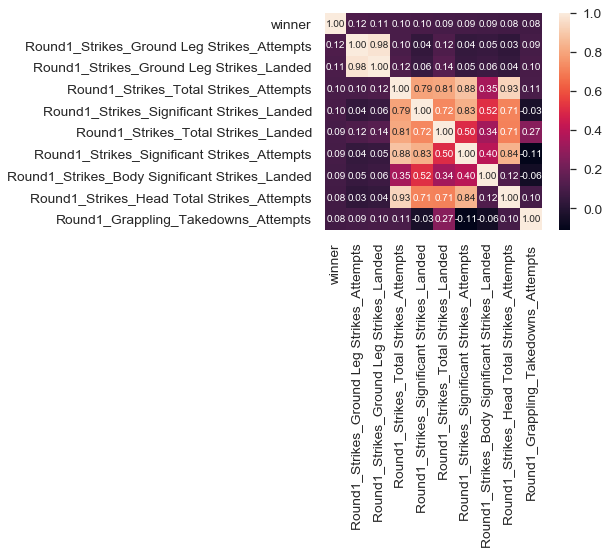

In [22]:
# Subset Correlation Matrix
n = 10 #number of variables for heatmap
corrmat = diff.corr()
cols = corrmat.nlargest(n, 'winner')['winner'].index
cm = np.corrcoef(diff[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [23]:
cols

Index(['winner', 'Round1_Strikes_Ground Leg Strikes_Attempts',
       'Round1_Strikes_Ground Leg Strikes_Landed',
       'Round1_Strikes_Total Strikes_Attempts',
       'Round1_Strikes_Significant Strikes_Landed',
       'Round1_Strikes_Total Strikes_Landed',
       'Round1_Strikes_Significant Strikes_Attempts',
       'Round1_Strikes_Body Significant Strikes_Landed',
       'Round1_Strikes_Head Total Strikes_Attempts',
       'Round1_Grappling_Takedowns_Attempts'],
      dtype='object')

In [24]:
#Pretty crazy that the strongest correlation to winning the fight from first round data is ground leg strikes.
#I guess it makes sense because leg strikes are known to really wear down opponents. Still suprising

In [25]:
D = diff
for col in D.columns:
    D[col] = (D[col]-min(D[col]))/ (max(D[col]) - min(D[col])) #subtract the minimum and divide by the range forcing a scale of 0 to 1 for each feature
D

,Prev,Age,Height,Weight,Round1_Grappling_Reversals_Landed,Round1_Grappling_Standups_Landed,Round1_Grappling_Submissions_Attempts,Round1_Grappling_Takedowns_Attempts,Round1_Grappling_Takedowns_Landed,Round1_Strikes_Body Significant Strikes_Attempts,Round1_Strikes_Body Significant Strikes_Landed,Round1_Strikes_Body Total Strikes_Attempts,Round1_Strikes_Body Total Strikes_Landed,Round1_Strikes_Clinch Body Strikes_Attempts,Round1_Strikes_Clinch Body Strikes_Landed,Round1_Strikes_Clinch Head Strikes_Attempts,Round1_Strikes_Clinch Head Strikes_Landed,Round1_Strikes_Clinch Leg Strikes_Attempts,Round1_Strikes_Clinch Leg Strikes_Landed,Round1_Strikes_Clinch Significant Kicks_Attempts,Round1_Strikes_Clinch Significant Kicks_Landed,Round1_Strikes_Clinch Significant Punches_Attempts,Round1_Strikes_Clinch Significant Punches_Landed,Round1_Strikes_Clinch Significant Strikes_Attempts,Round1_Strikes_Clinch Significant Strikes_Landed,Round1_Strikes_Clinch Total Strikes_Attempts,Round1_Strikes_Clinch Total Strikes_Landed,Round1_Strikes_Distance Body Kicks_Attempts,Round1_Strikes_Distance Body Kicks_Landed,Round1_Strikes_Distance Body Punches_Attempts,Round1_Strikes_Distance Body Punches_Landed,Round1_Strikes_Distance Body Strikes_Attempts,Round1_Strikes_Distance Body Strikes_Landed,Round1_Strikes_Distance Head Kicks_Attempts,Round1_Strikes_Distance Head Kicks_Landed,Round1_Strikes_Distance Head Punches_Attempts,Round1_Strikes_Distance Head Punches_Landed,Round1_Strikes_Distance Head Strikes_Attempts,Round1_Strikes_Distance Head Strikes_Landed,Round1_Strikes_Distance Leg Kicks_Attempts,Round1_Strikes_Distance Leg Kicks_Landed,Round1_Strikes_Distance Leg Strikes_Attempts,Round1_Strikes_Distance Leg Strikes_Landed,Round1_Strikes_Distance Strikes_Attempts,Round1_Strikes_Distance Strikes_Landed,Round1_Strikes_Ground Body Strikes_Attempts,Round1_Strikes_Ground Body Strikes_Landed,Round1_Strikes_Ground Head Strikes_Attempts,Round1_Strikes_Ground Head Strikes_Landed,Round1_Strikes_Ground Leg Strikes_Attempts,Round1_Strikes_Ground Leg Strikes_Landed,Round1_Strikes_Ground Significant Kicks_Attempts,Round1_Strikes_Ground Significant Kicks_Landed,Round1_Strikes_Ground Significant Punches_Attempts,Round1_Strikes_Ground Significant Punches_Landed,Round1_Strikes_Ground Significant Strikes_Attempts,Round1_Strikes_Ground Significant Strikes_Landed,Round1_Strikes_Ground Total Strikes_Attempts,Round1_Strikes_Ground Total Strikes_Landed,Round1_Strikes_Head Significant Strikes_Attempts,Round1_Strikes_Head Significant Strikes_Landed,Round1_Strikes_Head Total Strikes_Attempts,Round1_Strikes_Head Total Strikes_Landed,Round1_Strikes_Kicks_Attempts,Round1_Strikes_Kicks_Landed,Round1_Strikes_Knock Down_Landed,Round1_Strikes_Leg Total Strikes_Attempts,Round1_Strikes_Leg Total Strikes_Landed,Round1_Strikes_Legs Significant Strikes_Attempts,Round1_Strikes_Legs Significant Strikes_Landed,Round1_Strikes_Legs Total Strikes_Attempts,Round1_Strikes_Legs Total Strikes_Landed,Round1_Strikes_Punches_Attempts,Round1_Strikes_Punches_Landed,Round1_Strikes_Significant Strikes_Attempts,Round1_Strikes_Significant Strikes_Landed,Round1_Strikes_Total Strikes_Attempts,Round1_Strikes_Total Strikes_Landed,Round1_TIP_Back Control Time,Round1_TIP_Clinch Time,Round1_TIP_Control Time,Round1_TIP_Distance Time,Round1_TIP_Ground Control Time,Round1_TIP_Ground Time,Round1_TIP_Guard Control Time,Round1_TIP_Half Guard Control Time,Round1_TIP_Misc. Ground Control Time,Round1_TIP_Mount Control Time,Round1_TIP_Neutral Time,Round1_TIP_Side Control Time,Round1_TIP_Standing Time,winner
338,0.545455,0.505882,0.501272,0.500000,0.500000,0.600000,0.700000,0.621053,0.441860,0.705202,0.627737,0.647482,0.648000,0.692308,0.637168,0.511254,0.524590,0.586207,0.480769,0.571429,0.611111,0.459016,0.411765,0.600000,0.610465,0.404412,0.452663,0.492537,0.632653,0.581395,0.463415,0.683871,0.545455,0.352941,0.500000,0.342730,0.342960,0.562650,0.577093,0.275862,0.250000,0.446481,0.476268,0.553846,0.606028,0.314286,0.285714,0.4

In [26]:
y = D.loc[:, 'winner']
X = D.iloc[:, 0:-1]

X_train ,X_test ,y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=45)

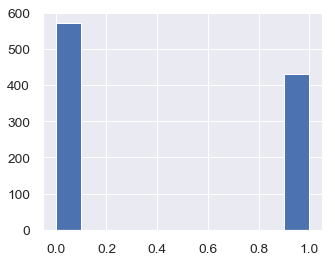

In [27]:
y.hist(figsize=(5,4))

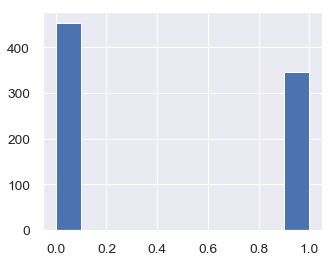

In [28]:
y_train.hist(figsize=(5,4))

In [29]:
#print metrics function
def print_metrics(test, preds):
    print("Precision Score: {}".format(precision_score(test, preds)))
    print("Recall Score: {}".format(recall_score(test, preds)))
    print("Accuracy Score: {}".format(accuracy_score(test, preds)))
    print("F1 Score: {}".format(f1_score(test, preds)))

In [30]:
#function to look at importance of features
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.figure(figsize=(20,20))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X_train.columns.values) 
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")

# Dummy Classifier

In [31]:
# Fitting and training the dummy
dummy = DummyClassifier(strategy='most_frequent', random_state=45)
dummy.fit(X_train, y_train)

# Dummy predictions
dum_pred = dummy.predict(X_test)

#Printing out results
print_metrics(y_test, dum_pred)

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, dum_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.0
Recall Score: 0.0
Accuracy Score: 0.5870646766169154
F1 Score: 0.0

Confusion Matrix
----------------


/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


Predicted,0.0,All
True,,
0.0,118,118
1.0,83,83
All,201,201


# Decision Tree

In [32]:
# Train a DT classifier

Detree = DecisionTreeClassifier(random_state=45)  
Detree.fit(X_train, y_train)  

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=45, splitter='best')

In [33]:
# Make predictions for test data

y_pred = Detree.predict(X_test) 

In [34]:
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.45454545454545453
Recall Score: 0.4819277108433735
Accuracy Score: 0.5472636815920398
F1 Score: 0.4678362573099415

AUC is :0.54

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,70,48,118
1.0,43,40,83
All,113,88,201


### Decision Tree 2 using Grid Search

In [35]:
param_distrib = {'max_depth': randint(1, 50),
                 'max_features': randint(1, 16),
                 'min_samples_split': randint(2, 1000),
                 'min_samples_leaf': randint(2, 1000),
                }
clf = RandomizedSearchCV(DecisionTreeClassifier(), param_distrib, n_iter=1000)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


{'max_depth': 38,
 'max_features': 15,
 'min_samples_leaf': 189,
 'min_samples_split': 25}

In [36]:
#creating grid for grid search for Decision tree
dt_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [5, 10, 15],
    'max_features': [6, 10, 15],
    'min_samples_leaf': [100, 200, 225],
    'min_samples_split': [2, 5, 8]
}

In [37]:
dt_grid_search = GridSearchCV(Detree, dt_param_grid, cv=3, return_train_score=True)
dt_grid_search.fit(X, y)

GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=DecisionTreeClassifier(class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort=False, random_state=45,
                                              splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 15], 'max_features': [6, 10, 15],

In [38]:
#decision tree with grid search
dt_gs_training_score = np.mean(dt_grid_search.cv_results_['mean_train_score'])
dt_gs_testing_score = dt_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(dt_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(dt_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
dt_grid_search.best_params_

Mean Training Score: 58.38%
Mean Testing Score: 59.74%
Best Parameter Combination Found During Grid Search:


{'criterion': 'gini',
 'max_depth': 5,
 'max_features': 10,
 'min_samples_leaf': 200,
 'min_samples_split': 2}

In [39]:
#Decision tree using new parameters from the grid search
Detree2 = DecisionTreeClassifier(criterion='gini',
                                 max_depth=5,
                                 max_features=10,
                                 min_samples_leaf=200,
                                 min_samples_split=2,
                                random_state=45)  
Detree2.fit(X_train, y_train)  

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=5,
                       max_features=10, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=45, splitter='best')

In [40]:
y_pred = Detree2.predict(X_test) 

In [41]:
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.42857142857142855
Recall Score: 0.25301204819277107
Accuracy Score: 0.5522388059701493
F1 Score: 0.3181818181818182

AUC is :0.51

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,90,28,118
1.0,62,21,83
All,152,49,201


# Logistic Regression

In [42]:
#logistic regression
logreg = LogisticRegression(fit_intercept = False, C = 1e16, random_state=45)
model_log = logreg.fit(X_train, y_train)
model_log

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1e+16, class_weight=None, dual=False, fit_intercept=False,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=45, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [43]:
y_pred = logreg.predict(X_test)

In [44]:
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.5128205128205128
Recall Score: 0.4819277108433735
Accuracy Score: 0.5970149253731343
F1 Score: 0.4968944099378882

AUC is :0.58

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,80,38,118
1.0,43,40,83
All,123,78,201


Test AUC: 0.5991423320400245
train AUC: 0.7254717221359273


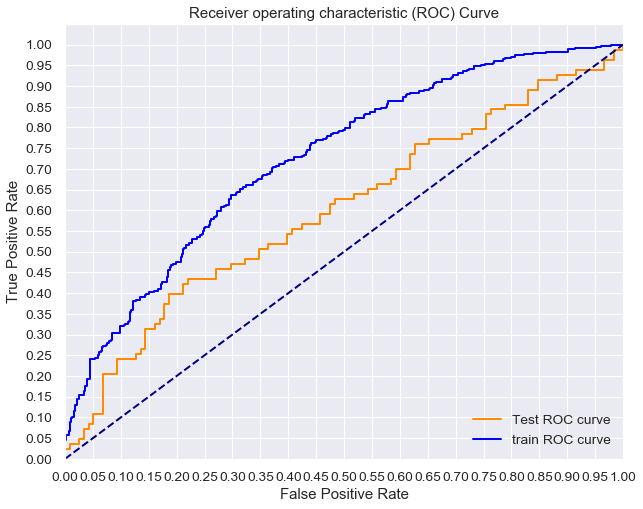

In [45]:
y_test_score = logreg.decision_function(X_test)
y_train_score = logreg.decision_function(X_train)

test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_score)
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_score)

print('Test AUC: {}'.format(auc(test_fpr, test_tpr)))
print('train AUC: {}'.format(auc(train_fpr, train_tpr)))

plt.figure(figsize=(10,8))
lw = 2
plt.plot(test_fpr, test_tpr, color='darkorange',
         lw=lw, label='Test ROC curve')
plt.plot(train_fpr, train_tpr, color='blue',
         lw=lw, label='train ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Random Forest

In [46]:
forest = RandomForestClassifier(random_state=45)
forest.fit(X_train, y_train)

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=45, verbose=0,
                       warm_start=False)

In [47]:
y_pred = forest.predict(X_test)

In [48]:
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.48936170212765956
Recall Score: 0.27710843373493976
Accuracy Score: 0.582089552238806
F1 Score: 0.3538461538461538

AUC is :0.54

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,94,24,118
1.0,60,23,83
All,154,47,201


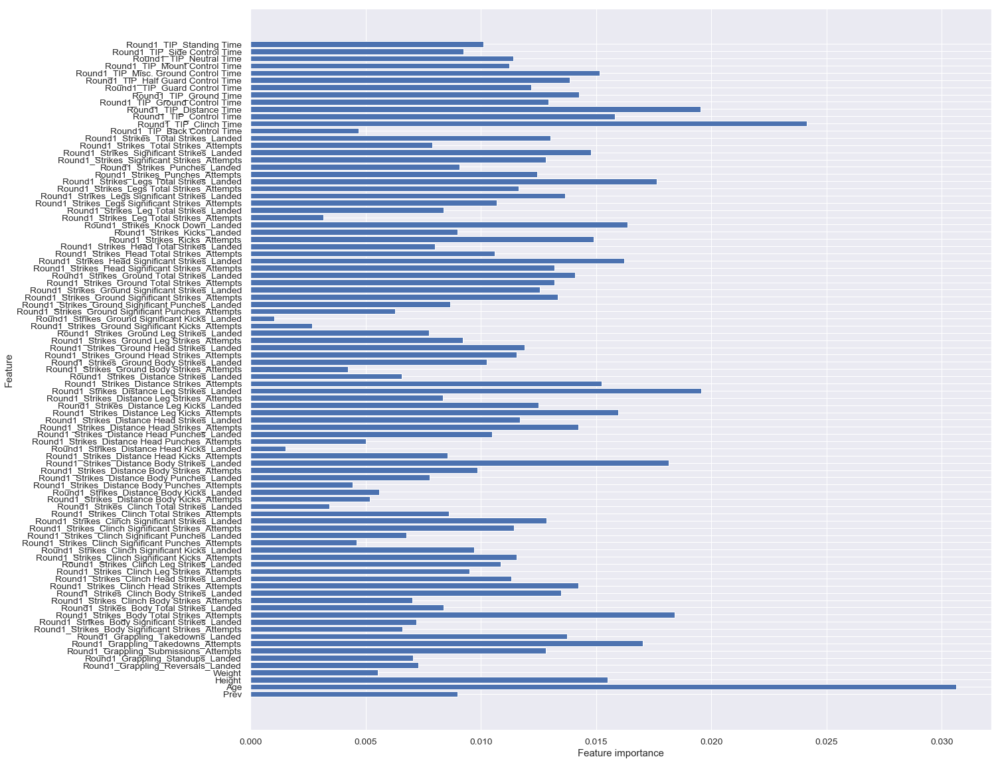

In [49]:
plot_feature_importances(forest)

### grid search on random forest

In [50]:
param_distrib = {'max_depth': randint(1, 50),
                 'max_features': randint(1, 16),
                 'min_samples_split': randint(2, 1000),
                 'min_samples_leaf': randint(2, 1000),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(RandomForestClassifier(), param_distrib, n_iter=1000)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


{'max_depth': 20,
 'max_features': 14,
 'min_samples_leaf': 145,
 'min_samples_split': 347,
 'n_estimators': 10}

In [51]:
#creating grid for grid search for random forest
rf_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 2, 5, 10],
    'max_features': [None, 2, 10, 20],
    'min_samples_split': [2, 10, 50],
    'min_samples_leaf': [25, 50, 100],
    'n_estimators': [10, 50, 100],
}

In [53]:
rf_grid_search = GridSearchCV(forest, rf_param_grid, cv=3, return_train_score=True, verbose=3)
rf_grid_search.fit(X, y)

Fitting 3 folds for each of 864 candidates, totalling 2592 fits
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.760, test=0.530), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.763, test=0.560), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.789, test=0.625), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s


[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.783, test=0.551), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.784, test=0.551), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.808, test=0.589), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.783, test=0.566), total=   1.0s
[

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.702, test=0.557), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.696, test=0.551), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.677, test=0.619), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.684, test=0.551), total=   0

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.646, test=0.563), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.627, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.635, test=0.607), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.642, test=0.578), t

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.714, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.679, test=0.566), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.654, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.685, test=0.548), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.621, test=0.569), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.603, test=0.584), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.584, test=0.571), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.616, test=0.566), total=   0.1s
[CV] criterion=

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.571, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.571, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.572, test=0.571), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.721, test=0.566), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.661, test=0.560), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.692, test=0.592), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.684, test=0.578), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.648, test=0.563), total=   0.1s
[CV] criterio

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.612, test=0.566), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.588, test=0.559), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.633, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.615, test=0.596), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.765, test=0.551), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.751, test=0.545), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.786, test=0.595), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.783, test=0.560), total=   0.3s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.703, test=0.560), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.664, test=0.545), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.677, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.679, test=0.581), total=   0.0s
[CV] 

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.639, test=0.572), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.609, test=0.560), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.632, test=0.574), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.569), total=   0.3s
[

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.651, test=0.563), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.587), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.662, test=0.607), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.642, test=0.554), total=   0.1s
[CV] criterion

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.625, test=0.599), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.636, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.642, test=0.569), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.633, test=0.563), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.579, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.574, test=0.569), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.572, test=0.571), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.591, test=0.584), total=   0.0s
[CV] criterion=gini, max_depth=2, max_

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.572, test=0.571), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.580, test=0.569), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.571, test=0.569), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.572, test=0.571), total=   0.1s
[CV] criterion=gini, max_depth=2

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.573, test=0.569), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.571, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.572, test=0.571), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.571, test=0.572), total=   0.1s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.596, test=0.580), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.642, test=0.539), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.622, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.605, test=0.562), total=   0.0s
[CV] criterion=gini, max_depth=2, ma

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.625, test=0.560), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.606, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.600, test=0.565), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.627, test=0.575), total=   0.2s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.633, test=0.574), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.639, test=0.572), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.631, test=0.587), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.614, test=0.589), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.660, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.624, test=0.554), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.636, test=0.607), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.655, test=0.575), total=   0.4s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.612, test=0.560), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.615, test=0.586), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.619, test=0.578), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.615, test=0.578), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.753, test=0.634), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.748, test=0.551), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.756, test=0.548), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.787, test=0.595), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.692, test=0.637), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.700, test=0.557), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.691, test=0.545), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.677, test=0.619), total=   0.6s
[CV] criter

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.635, test=0.610), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.679, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.664, test=0.560), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.659, test=0.589), total=   0.0s
[CV] criterion=gini, max_depth=5, max_f

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.622, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.604, test=0.581), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.584, test=0.568), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.613, test=0.566), total=   0.1s
[CV] criterion=gini, max_depth=5, max_featu

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.572, test=0.571), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.576, test=0.569), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.582, test=0.563), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.572, test=0.571), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.732, test=0.581), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.750, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.741, test=0.572), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.718, test=0.572), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.583), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.575), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.657, test=0.608), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.648, test=0.583), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.627, test=0.557), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.612, test=0.569), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.603, test=0.565), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.628, test=0.569), total=   0.1s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.727, test=0.551), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.738, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.679, test=0.581), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.649, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=5

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.609, test=0.560), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.632, test=0.574), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.643, test=0.569), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.619, test=0.563), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.802, test=0.595), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.760, test=0.530), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.763, test=0.560), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.789, test=0.625), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.666, test=0.586), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.694, test=0.554), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.687, test=0.557), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.692, test=0.640), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.635, test=0.607), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.642, test=0.578), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.618, test=0.569), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.635, test=0.610), total=   0.

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.651, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.685, test=0.548), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.678, test=0.563), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.693, test=0.565), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.584, test=0.571), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.616, test=0.566), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.600, test=0.566), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.575, test=0.574), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.711, test=0.575), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.728, test=0.565), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.756, test=0.551), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.748, test=0.584), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.692, test=0.592), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.684, test=0.578), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.648, test=0.563), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.675, test=0.583), total=   0.2s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.603, test=0.565), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.628, test=0.569), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.612, test=0.566), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.588, test=0.559), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.739, test=0.572), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.737, test=0.577), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.765, test=0.551), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.751, test=0.545), total=   0.5s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.703, test=0.560), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.664, test=0.545), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.677, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.624, test=0.584), total=   0.0s
[CV] criterion=gini

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.777, test=0.575), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.766, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.795, test=0.554), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.808, test=0.58

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.700, test=0.560), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.694, test=0.554), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.699, test=0.622), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.708, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.633, test=0.601), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.642, test=0.572), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.621, test=0.578), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.6

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.562), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.688, test=0.551), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.682, test=0.566), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.695, test=0.571), total=   0

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.587, test=0.574), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.615, test=0.563), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.604, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.575, test=0.571), tota

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.572, test=0.571), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.576, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.582, test=0.563), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.572, test=0.571), to

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.763, test=0.539), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.751, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.789, test=0.616), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.772, test=0.557), t

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.678, test=0.578), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.551), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.675, test=0.598), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.642, test=0.563)

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.593, test=0.565), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.742, test=0.533), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.732, test=0.563), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.751, test=0.613), total= 

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.702, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.669, test=0.560), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.681, test=0.625), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.703, test=0.557), total=  

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.637, test=0.566), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.616, test=0.566), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.626, test=0.586), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.624, test=0.58

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.668, test=0.604), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.655, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.633, test=0.599), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.650, test=0.643), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.652, test=0.557), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.636, test=0.560), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.657, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.660, test=0.563), total=  

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.642, test=0.572), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.616, test=0.575), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.632, test=0.610), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.640, test=0.560)

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.586, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.574, test=0.566), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.572, test=0.571), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.579, test=0.572), total=   0.1s
[CV] criterion=

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.571, test=0.569), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.572, test=0.571), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.576, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.580, test=0.566), total=   0.0s
[CV] criterion

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.652, test=0.560), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.618, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.593, test=0.568), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.642, test=0.569), total=   0.1s
[CV] criterion=

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.636, test=0.557), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.618, test=0.569), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.596, test=0.574), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.642, test=0.539), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.606, test=0.572), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.597, test=0.568), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.627, test=0.563), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.609, test=0.566), total=   0.1s

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.634, test=0.563), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.636, test=0.574), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.634, test=0.551), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.628, test=0.587), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.658, test=0.569), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.618, test=0.554), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.645, test=0.598), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.657, test=0.575), total=   0.7s
[CV] cri

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.637, test=0.566), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.616, test=0.563), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.617, test=0.589), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.738, test=0.530), total=   0.2

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.666, test=0.575), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.678, test=0.592), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.699, test=0.560), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.697, test=0.557), total=   0.4s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.633, test=0.563), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.633, test=0.601), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.642, test=0.572), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.621, test=0.578), total=

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.630, test=0.571), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.593), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.663, test=0.560), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.592), total=   0.0s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.587, test=0.574), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.615, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.601, test=0.560), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.575, test=0.571), total=   0.1s
[CV] criter

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.572, test=0.571), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.576, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.582, test=0.563), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.572, test=0.571), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.727, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.740, test=0.616), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.739, test=0.578), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.718, test=0.560), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.675, test=0.595), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.642, test=0.563), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.615, test=0.596), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.609, test=0.571), total=   0.0s
[CV] crit

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.739, test=0.557), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.733, test=0.569), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.744, test=0.631), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.760, test=0.581), total=   0.3s
[CV] criterion=

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.700, test=0.557), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.669, test=0.545), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.677, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.682, test=0.557), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.624, test=0.584), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.615, test=0.578), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.620, test=0.598), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.643, test=0.569), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.795, test=0.554), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.808, test=0.581), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.805, test=0.583), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.810, test=0.554), t

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.708, test=0.566), total=   1.0s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.697, test=0.539), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.684, test=0.625), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.697, test=0.572)

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.633, test=0.607), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.636, test=0.557), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.627, test=0.605), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.636, test=0.6

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.700, test=0.548), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.679, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.677, test=0.565), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.703, test=0.551), total=   0.1s
[CV] cri

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.604, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.575, test=0.571), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.576, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.582, test=0.563), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.751, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.789, test=0.616), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.772, test=0.557), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.750, test=0.578), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.675, test=0.598), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.666, test=0.575), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.658, test=0.608), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.654, test=0.574), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.612, test=0.569), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.597, test=0.562), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.627, test=0.572), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.613, test=0.566), total=

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.763, test=0.572), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.786, test=0.598), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.742, test=0.533), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.732, test=0.563), total=   0.0s


[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.702, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.669, test=0.560), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.681, test=0.625), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.703, test=0.557), total=   0.3s
[

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.637, test=0.566), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.616, test=0.566), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.626, test=0.586), total=   0.2s


[Parallel(n_jobs=1)]: Done 2592 out of 2592 | elapsed:  8.6min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=10, n_jobs=None,
                                              oob_score=False, random_state=45,
                                              verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'crit

In [54]:
rf_gs_training_score = np.mean(rf_grid_search.cv_results_['mean_train_score'])
rf_gs_testing_score = rf_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(rf_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(rf_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
rf_grid_search.best_params_

Mean Training Score: 65.63%
Mean Testing Score: 63.74%
Best Parameter Combination Found During Grid Search:


{'criterion': 'entropy',
 'max_depth': 2,
 'max_features': None,
 'min_samples_leaf': 25,
 'min_samples_split': 2,
 'n_estimators': 10}

In [55]:
forest2 = RandomForestClassifier(criterion='entropy',
                                 max_depth=2,
                                 max_features=None,
                                 min_samples_leaf=25,
                                 min_samples_split=2,
                                 n_estimators=10,
                                random_state=45)  
forest2.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=2, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=25, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=45, verbose=0,
                       warm_start=False)

In [56]:
y_pred = forest2.predict(X_test)

In [57]:
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6382978723404256
Recall Score: 0.3614457831325301
Accuracy Score: 0.6517412935323383
F1 Score: 0.46153846153846156

AUC is :0.61

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,101,17,118
1.0,53,30,83
All,154,47,201


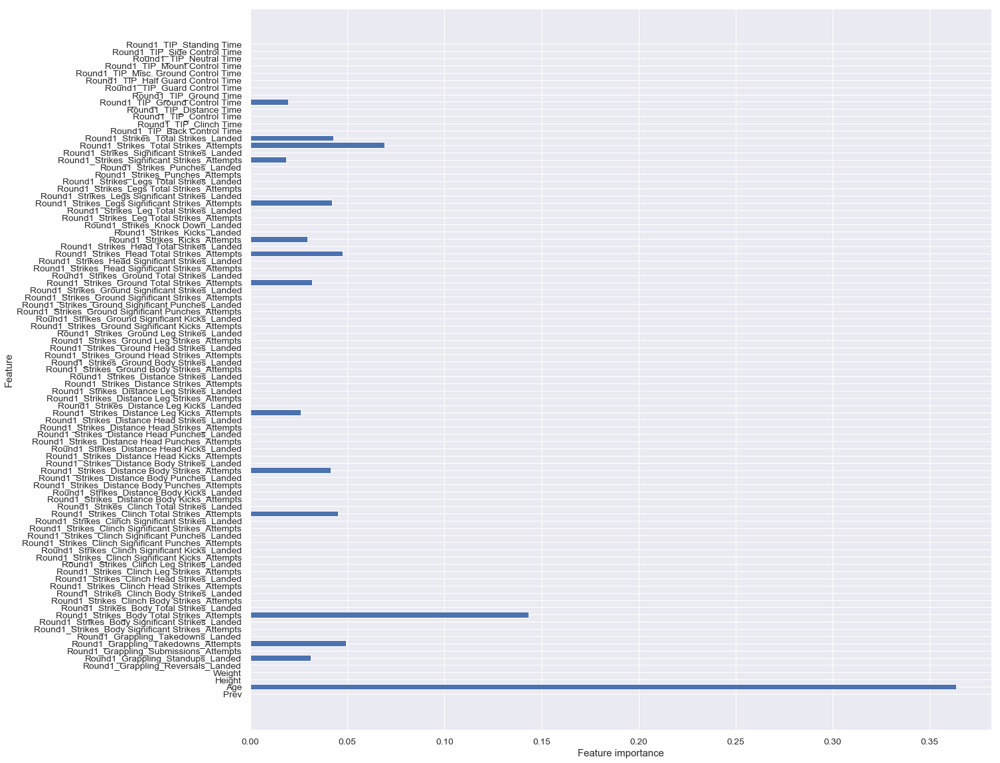

In [58]:
#importance of features
plot_feature_importances(forest2)

# XGBoost

In [59]:
# to help kernel not die when running XG Boost 
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from xgboost import XGBClassifier

In [60]:
booster = xgb.XGBClassifier(random_state=45)
booster.fit(X_train, y_train)
y_pred = booster.predict(X_test)

In [61]:
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.4805194805194805
Recall Score: 0.4457831325301205
Accuracy Score: 0.572139303482587
F1 Score: 0.46249999999999997

AUC is :0.55

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,78,40,118
1.0,46,37,83
All,124,77,201


### Grid Search for XGBoost

In [62]:
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 16),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


{'max_depth': 5,
 'max_features': 7,
 'min_samples_leaf': 186,
 'min_samples_split': 579,
 'n_estimators': 10}

In [67]:
#creating grid for grid search for random forest
xg_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [2, 5, 10],
    'max_features': [None, 2, 5, 10],
    'min_samples_split': [2, 10, 50, 100],
    'min_samples_leaf': [2, 10, 50, 100],
    'n_estimators': [10, 30, 60, 100]
}

In [68]:
xg_grid_search = GridSearchCV(xgb.XGBClassifier(), xg_param_grid, cv=3, return_train_score=True, verbose=3)
xg_grid_search.fit(X, y)

Fitting 3 folds for each of 1536 candidates, totalling 4608 fits
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.647, test=0.613), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=0.718, test=0.554), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=0.717, test=0.602), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100, score=(train=0.840, test=0.539), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100, score=(train=0.847, test=0.593), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100, score=(train=0.850, test=0.601), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=100, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100, score=(train=0.840, test=0.539), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.551), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.840, test=0.539), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.551), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=2, max_feat

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.799, test=0.608), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.786, test=0.601), total=   0.2s
[CV] criterion=gini, max_depth=2, max_feature

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=2, m

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.799, test=0.608), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.786, test=0.601), total=   0.2s
[CV] criterion=gini, max_depth=2, max_

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=2, max_feat

[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.799, test=0.608), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.786, test=0.601), total=   0.2s
[CV] criterion=gini, max_depth=2, max_feature

[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.4s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=2, m

[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.799, test=0.608), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.786, test=0.601), total=   0.3s
[CV] criterion=gini, max_depth=2, max_

[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.718, test=0.554), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.847, test=0.593), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=2, m

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.799, test=0.608), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.786, test=0.601), total=   0.3s
[CV] criterion=gini, max_depth=2, max_

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.4s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.593), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.799, test=0.608), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.786, test=0.601), total=   0.2s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.999, test=0.572), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.574), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.991, test=0.545), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.999, test=0.557), total=   0.6s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=100, score=(train=0.999, test=0.572), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.574), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=0.963, test=0.593), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=60, score=(train=0.999, test=0.557), total=   0.6s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.999, test=0.572), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.574), total=   1.0s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=0.991, test=0.545), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=0.999, test=0.557), total=   0.5s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=0.999, test=0.572), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=5, max_feature

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=0.999, test=0.557), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=gini, max_depth=5, max_

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=10, score=(train=0.891, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=10, score=(train=0.900, test=0.622), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=30, score=(train=0.945, test=0.545), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=gini, max_depth=5, max_

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.539), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.999, test=0.572), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.574), total=   1.0s
[CV] criterion=gini, max_depth=5, max_f

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=60, score=(train=0.991, test=0.545), total=   0.5s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.999, test=0.572), total=   1.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.574), total=   1.3s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.856, test=0.593), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=0.991, test=0.545), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=0.999, test=0.557), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=5, mi

[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=10, score=(train=0.900, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=0.963, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=5, max_

[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.539), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=0.999, test=0.572), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.574), total=   0.8s
[CV] criterion=gini, max_depth=5

[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60, score=(train=0.991, test=0.545), total=   0.5s
[CV] criterion=gini, max_depth=5, max_feature

[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.999, test=0.572), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60, score=(train=0.999, test=0.557), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.900, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=gini, max_depth=5, max_feature

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.539), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=100, score=(train=0.999, test=0.572), total=   1.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criterion=gini, max_depth=5

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=60, score=(train=0.991, test=0.545), total=   0.5s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=100, score=(train=0.999, test=0.572), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.574), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=0.999, test=0.557), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.571), total=   0.6s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.900, test=0.622), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=0.963, test=0.593), total=   0.5s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.539), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.999, test=0.572), total=   0.8s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.999, test=0.589), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.545), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.601), total=   1.9s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=10, score=(train=0.999, test=0.589), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.542), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.545), total=   1.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.560), total=   1.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.601), total=   1.4s
[CV]

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.542), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.634), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.545), total=   1.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.601), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.996, test=0.518), total=   0

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] criterion=gini, max_depth=10, max

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.560), total=   1.8s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.601), total=   1.6s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=10, score=(train=0.996, test=0.518), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=10, score=(train=0.999, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=1

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.634), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.569), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.999, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.999, test=0.589), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.596), total=   0.7s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.545), total=   1.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.560), total=   1.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.601), total=   1.4s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.560), total=   1.3s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.601), total=   1.3s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=10, score=(train=0.996, test=0.518), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=10, score=(train=0.999, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=10, max

[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.545), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.569), total=   1.3s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10, score=(train=0.999, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10, score=(train=0.999, test=0.589), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.625), total=   1.3s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.545), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.601), total=   1.4s
[CV] criterion=gini, max_depth=1

[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.601), total=   1.7s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.996, test=0.518), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.999, test=0.566), total=   0.2s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.569), total=   1.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=gini, max_depth=10, max

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=10, score=(train=0.999, test=0.566), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=10, score=(train=0.999, test=0.589), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.596), total=   0.6s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.545), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.601), total=   1.4s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.601), total=   1.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.996, test=0.518), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.999, test=0.566), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=30 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=60 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.569), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.560), total=   1.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.601), total=   1.6s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] cr

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=60, score=(train=0.799, test=0.608), total=   0.3s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=0.847, test=0.593), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.551), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.593), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.799, test=0.608), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.786, test=0.601), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.647, test=0.613), total=   

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.799, test=0.608), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.786, test=0.601), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.840, test=0.539), total=  

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.53

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.840, test=0.539), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=2, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entr

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=0.718, test=0.554), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=0.717, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=entropy, 

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=100, score=(train=0.840, test=0.539), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=100, score=(train=0.850, test=0.601), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=10, min_samples_split=100, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.840, test=0.539), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.551), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=0.718, test=0.554), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=0.717, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=0.840, test=0.539), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=0.847, test=0.593), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entropy, 

[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=0.799, test=0.608), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=0.786, test=0.601), total=   0.3s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10, score=(train=0.647, test=0.613), total=   0.1s
[CV] criterion=e

[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60, score=(train=0.799, test=0.608), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60, score=(train=0.786, test=0.601), total=   0.2s
[CV] criterion=entropy, 

[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.647, test=0.613), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60, score=(train=0.799, test=0.608), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60, score=(train=0.786, test=0.601), total=   0.2s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.647, test=0.613), total=   0.0s
[CV] criterion=entro

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=60, score=(train=0.799, test=0.608), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=60, score=(train=0.786, test=0.601), total=   0.3s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=10, score=(train=0.647, test=0.613), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.731, test=0.610), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.783, test=0.539), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.799, test=0.608), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.786, test=0.601), total=   0.3s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.647, test=0.613), total=   0.1s
[CV] crit

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=0.731, test=0.610), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.783, test=0.539), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.799, test=0.608), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.786, test=0.601), total=   0.2s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.850, test=0.601), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.670, test=0.551), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.673, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.647, test=0.613), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=60, score=(train=0.991, test=0.545), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=60, score=(train=0.999, test=0.557), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=2, n_estimators=10, score=(train=0.900, test=0.622), total=   0.1s
[

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=30, score=(train=0.978, test=0.592), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=60, score=(train=0.991, test=0.545), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=60, score=(train=0.999, test=0.557), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=10, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.571), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.574), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.900, test=0.622), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=60, score=(train=0.999, test=0.557), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.571), tot

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.900, test=0.622), to

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=0.999, test=0.557), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.571), total=   0.7s
[CV] criterion=entropy, max_dep

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=10, score=(train=0.900, test=0.622), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=0.945, test=0.545), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=0.963, test=0.593), total=   0.4s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=10, n_estimators=60, score=(train=0.999, test=0.557), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.539), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=0.999, test=0.572), total=   0.9s
[CV] criterio

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.891, test=0.620), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.900, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=0.945, test=0.545), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=0.963, test=0.593), total=   0.4s
[CV] criterion=entropy, 

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=0.999, test=0.557), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.539), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.999, test=0.572), total=   0.8s
[CV] criterio

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.900, test=0.622), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.571), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.539), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.999, test=0.572), total=   1.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.574), total=   0.

[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=0.978, test=0.592), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=2, min_samples_split=50, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] criterion=entropy, 

[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.539), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=0.999, test=0.572), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.574), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.945, test=0.545), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=0.978, test=0.592), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.539), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.999, test=0.572), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] criteri

[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=0.945, test=0.545), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.539), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.999, test=0.572), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=10, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.539), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=100, score=(train=0.999, test=0.572), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=2, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] cr

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=50, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=50, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=50, n_estimators=30, score=(train=0.978, test=0.592), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=10, min_samples_split=50, n_estimators=60, score=(train=0.991, test=0.545), total=   0.7s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.539), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.999, test=0.572), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.574), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=0.945, test=0.545), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=0.963, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=30, score=(train=0.978, test=0.592), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=60, score=(train=0.991, test=0.545), total=   0.6s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.539), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.999, test=0.572), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.574), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.856, test=0.593), total=   0.1

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.545), total=   1.0s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.545), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.601), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=100, n_estimators=10, score=(train=0.996, test=0.518), tot

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.545), tot

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.545), total=   1.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=10, min_samples_split=100, n_estimators=100, score=(train=1.000, tes

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.634), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.545), tot

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.545), total=   1.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.560), total=   1.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.601

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.999, test=0.566), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.999, test=0.589), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=30, score=(train=1.000, te

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.569), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.545), total=   1.8s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.560), total=   1.5s
[CV] criterio

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=10, score=(train=0.999, test=0.566), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=10, score=(train=0.999, test=0.589), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.542), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.596), total=   0.4s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.569), total=   1.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.625), total=   1.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.545), total=   1.7s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=10, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.560), total=   1.5s
[CV] c

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.999, test=0.589), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.634), total=   0.4s
[CV] crite

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.625), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.545), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.601), total=   1.

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.542), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.596), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.545), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.560), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.601), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=10, n_estimators=10, score=(train=0.996, test=0.518), total=   0.2s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] crite

[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.545), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.560), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.601), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=10, min_samples_split=50, n_estimators=10, score=(train=0.996, test=0.518), total=   0.2s
[CV] 

[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.596), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.545), total=   1.1s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.545), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.560), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.601), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.996, test=0.518), total=   0.2s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=10, n_estimators=60, score=(train=1.000, test=0.545), total=   1.0s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.545), total=   1.5s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=5, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=1.000, test=0.601), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=2, n_estimators=10, score=(train=0.996, test=0.518), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=2, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.545), total=   0.9s
[CV] crite

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.545), total=   1.6s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.560), total=   1.9s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=2, n_estimators=100, score=(train=1.000, test=0.601), total=   1.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=10, n_estimators=10, score=(train=0.996, test=0.518), total=   0.2s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=10, min_samples_split=100, n_estimators=60, score=(train=1.000, test=0.545), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.545), total=   1.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.560), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=1.000, test=0.601), total=   1.7s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.996, test=0.518), total=   0.2

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.542), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.596), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=30, score=(train=1.000, test=0.634), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=60, score=(train=1.000, test=0.545), total=   1.0s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.545), total=   1.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.560), total=   2.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.601), total=   1.8s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.996, test=0.518), tot

[Parallel(n_jobs=1)]: Done 4608 out of 4608 | elapsed: 38.1min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_l...
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 5, 10],
                         'max_features': [None, 2, 5, 10],
    

In [69]:
xg_gs_training_score = np.mean(xg_grid_search.cv_results_['mean_train_score'])
xg_gs_testing_score = xg_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(xg_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(xg_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
xg_grid_search.best_params_

Mean Training Score: 90.48%
Mean Testing Score: 82.12%
Best Parameter Combination Found During Grid Search:


{'criterion': 'gini',
 'max_depth': 5,
 'max_features': None,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 10}

In [70]:
xg2 = xgb.XGBClassifier(criterion='gini',
                        max_depth=5,
                        max_features=None,
                        min_samples_leaf=2,
                        min_samples_split=2,
                        n_estimators=10)  
xg2.fit(X_train, y_train)
y_pred = xg2.predict(X_test)

In [71]:
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.5230769230769231
Recall Score: 0.40963855421686746
Accuracy Score: 0.6019900497512438
F1 Score: 0.45945945945945943

AUC is :0.57

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,87,31,118
1.0,49,34,83
All,136,65,201


# KNN

In [80]:
KNN = KNeighborsClassifier()
KNN.fit(X_train, y_train)
y_preds = KNN.predict(X_test)

In [81]:
#Printing out results
print_metrics(y_test, y_preds)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.5194805194805194
Recall Score: 0.4819277108433735
Accuracy Score: 0.6019900497512438
F1 Score: 0.5

AUC is :0.57

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,87,31,118
1.0,49,34,83
All,136,65,201


# SMOTE

In [ ]:
print(y.value_counts()) #previous winners
smote = SMOTE()
X_train, y_train = smote.fit_sample(X_train, y_train)
print(pd.Series(y_train).value_counts())

In [ ]:
#explore the distribution of the features and create new features
#effect size - given all of the features (fight statistics) how different are the 2 classes (winning or losing)
#look at AUC and ROC curves
#figure out if it is better to have a high precision or recall - not sure how this really applies to my data set
#perform feature selection using PCA and/or regularization
#look at what features have a high covariance with eachother - maybe